## Imports

In [1]:
# !pip install tensorflow-hub
# !pip install tensorflow
# !pip install scikit-image
# !pip install pydot
# !pip install graphviz

In [2]:
import os
import cv2
import copy
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub
import matplotlib.pyplot as plt
import matplotlib.pyplot as mpplot

from tensorflow.keras import layers, losses
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Conv2D, concatenate

# Data Pipeline


In [3]:
# hyper-parameters

img_size = 224
miss_size = 200
img_channels = 3
missing_rate = 0.9
splitting_rate = 0.8
window_len = 200
csi_matrix_shape = (window_len, 208)

In [4]:
%cd /mnt/nas/Project_02/Datasets/Indoors
!ls

# images
raw_img = np.load('./camera_1/raw_img_(224_224).npy', allow_pickle=True, encoding="latin1") 

# # CSI
# csi_01 = np.load('./CSI/amp_01.npy', allow_pickle=True, encoding="latin1")
# csi_02 = np.load('./CSI/amp_02.npy', allow_pickle=True, encoding="latin1")
# csi_03 = np.load('./CSI/amp_03.npy', allow_pickle=True, encoding="latin1")
# csi_04 = np.load('./CSI/amp_04.npy', allow_pickle=True, encoding="latin1")

# csi_05 = np.load('./CSI/amp_05.npy', allow_pickle=True, encoding="latin1")
# csi_06 = np.load('./CSI/amp_06.npy', allow_pickle=True, encoding="latin1")
# csi_07 = np.load('./CSI/amp_07.npy', allow_pickle=True, encoding="latin1")
# csi_08 = np.load('./CSI/amp_08.npy', allow_pickle=True, encoding="latin1")
# csi_09 = np.load('./CSI/amp_09.npy', allow_pickle=True, encoding="latin1")


/mnt/nas/Project_02/Datasets/Indoors
230125_2   camera_3		      mask256x256
Baselines  csi_decoder_csi2csi_tf_#1  mask256x256_2
CSI	   csi_decoder_csi2csi_tf_#6  model.png
RSSI	   csi_encoder_csi2csi_tf_#6  sigmoid_csi_encoder
camera_1   imaeg_encoder_vit_ver1     single_img
camera_2   image_decoder_vit_ver1     steps


In [5]:
# def making_csi_matrix(csi):
 
#     train_csi_set = []
#     test_csi_set = []
    
#     total_csi_num = csi.shape[0]
#     time_stamp = int(splitting_rate*total_csi_num) 
    
#     for count in range(int(0.5*window_len), time_stamp-int(0.5*window_len)): 
#         train_csi_matrix = []
#         for i in range(count-int(0.5*window_len), count+int(0.5*window_len)):
#             train_csi_matrix.append(csi[i])
#         train_csi_set.append(train_csi_matrix)
       

#     for count in range(time_stamp + int(0.5*window_len), int(total_csi_num-window_len*0.5)):  
#         test_csi_matrix = []
#         for i in range(count-int(0.5*window_len), count+int(0.5*window_len)):
#             test_csi_matrix.append(csi[i])
#         test_csi_set.append(test_csi_matrix) 
    
    
#     train_csi_set = np.array(train_csi_set)
#     test_csi_set = np.array(test_csi_set)
    
#     return train_csi_set, test_csi_set


# train_csi_set_01, test_csi_set_01 =  making_csi_matrix(csi_01)
# train_csi_set_02, test_csi_set_02 =  making_csi_matrix(csi_02)
# train_csi_set_03, test_csi_set_03 =  making_csi_matrix(csi_03)
# train_csi_set_04, test_csi_set_04 =  making_csi_matrix(csi_04)

In [6]:
# # test 

# print(train_csi_set_01.shape)

In [7]:
def image_splitter(img_set):

    train_gd_img = []
    test_gd_img = []
    
    total_img_num = img_set.shape[0]
    time_stamp = int(splitting_rate*total_img_num) 

    for count in range(int(0.5*window_len), int(time_stamp-window_len*0.5)):  
        img_set[count] = cv2.cvtColor(img_set[count], cv2.COLOR_BGR2RGB)     
        train_gd_img.append(img_set[count]) 
       
    for count in range(time_stamp + int(0.5*window_len), int(total_img_num-window_len*0.5)): 
        img_set[count] = cv2.cvtColor(img_set[count], cv2.COLOR_BGR2RGB)     
        test_gd_img.append(img_set[count]) 
    
    
    train_gd_img = np.array(train_gd_img)
    test_gd_img = np.array(test_gd_img)
    
    return train_gd_img, test_gd_img


train_gd_img, test_gd_img = image_splitter(raw_img)

In [8]:
# test 
print(train_gd_img.shape)
print('num of train_img:', len(train_gd_img))
print('num of test_img:', len(test_gd_img))
print('type of train_img:', type(train_gd_img))

(9400, 224, 224, 3)
num of train_img: 9400
num of test_img: 2200
type of train_img: <class 'numpy.ndarray'>


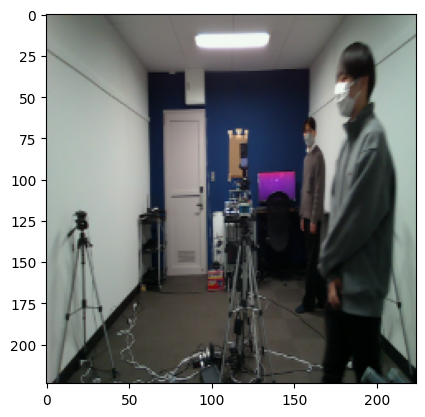

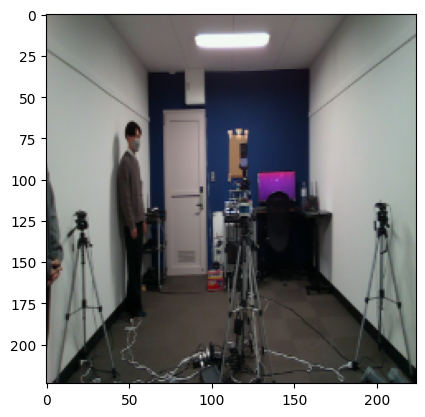

In [9]:
# test 

plt.imshow(train_gd_img[0])
plt.show()

plt.imshow(test_gd_img[0])
plt.show()

In [10]:
def get_blocked_img(img_set):
    
    blocked_img_set = []
    
    for raw_image in img_set:
        img = copy.deepcopy(raw_image)
        img[:, :miss_size , :] = 0
        blocked_img_set.append(img)

    blocked_img_set = np.array(blocked_img_set)

    return blocked_img_set

train_blocked_img = get_blocked_img(train_gd_img)
test_blocked_img = get_blocked_img(test_gd_img)

# Model Utility

In [12]:
# Hyperparameters

transformer_layers = 8
num_heads = 4
projection_dim = 1000
transformer_units = [projection_dim * 2, projection_dim]
transformer_layers = 8
mlp_head_units = [2048, 1024]  
learning_rate = 0.001
batch_size = 32
num_epochs = 10


# Pretrained Model
MODEL_PATH = "https://tfhub.dev/sayakpaul/swin_base_patch4_window7_224_fe/1"

In [13]:
def image_only_baseline(model_url, image_size, transformer_layers, num_heads, projection_dim, transformer_units):
    # input 
    img = Input((image_size, image_size, 3))
    
    # encoder
    hub_module = hub.KerasLayer(model_url, trainable=True)
    x = hub_module(img, training=False)
    x = layers.Dense(784)(x)
    img_info_1 = layers.Reshape([28, 28, 1])(x)
    img_info_2 = layers.Resizing(28, 28, interpolation='bilinear', crop_to_aspect_ratio=False)(img)

    # decoder
    x = layers.concatenate([img_info_1, img_info_2])
    x = layers.Conv2D(32, 3, activation='relu', padding="same")(x)
    x = layers.UpSampling2D(size=(2, 2))(x)
    x = layers.Conv2D(64, 3, activation='relu', padding="same")(x)
    x = layers.UpSampling2D(size=(2, 2))(x)
    x = layers.Conv2D(128, 3, activation='relu', padding="same")(x)
    x = layers.UpSampling2D(size=(2, 2))(x)
    x = layers.concatenate([x, img])
    outputs = layers.Conv2D(3, 3, activation='relu', padding="same")(x)

    return Model(inputs=img, outputs=outputs)


In [14]:
model_url = MODEL_PATH
model = image_only_baseline(model_url, img_size, transformer_layers, num_heads, projection_dim, transformer_units)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 keras_layer (KerasLayer)    (None, 1024)                 8674322   ['input_1[0][0]']             
                                                          4                                       
                                                                                                  
 dense (Dense)               (None, 784)                  803600    ['keras_layer[0][0]']         
                                                                                                  
 reshape (Reshape)           (None, 28, 28, 1)            0         ['dense[0][0]']           

# Training & Validation

In [15]:
from tensorflow.keras.callbacks import LearningRateScheduler
callback = LearningRateScheduler(lambda ep: float(1e-3 * 0.975**ep))
model.compile(optimizer='adam', loss=losses.MeanSquaredError(),)

history = model.fit(
        x=[train_blocked_img],
        y=train_gd_img,
        batch_size=32,
        epochs=50,
        validation_split=0.1,
        callbacks=[callback])

Epoch 1/50
265/265 [==============================] - 245s 545ms/step - loss: 0.0139 - val_loss: 0.0091 - lr: 0.0010
Epoch 2/50
265/265 [==============================] - 135s 511ms/step - loss: 0.0095 - val_loss: 0.0079 - lr: 9.7500e-04
Epoch 3/50
265/265 [==============================] - 134s 507ms/step - loss: 0.0088 - val_loss: 0.0075 - lr: 9.5062e-04
Epoch 4/50
265/265 [==============================] - 136s 514ms/step - loss: 0.0084 - val_loss: 0.0071 - lr: 9.2686e-04
Epoch 5/50
265/265 [==============================] - 135s 508ms/step - loss: 0.0081 - val_loss: 0.0071 - lr: 9.0369e-04
Epoch 6/50
265/265 [==============================] - 134s 507ms/step - loss: 0.0080 - val_loss: 0.0069 - lr: 8.8110e-04
Epoch 7/50
265/265 [==============================] - 132s 497ms/step - loss: 0.0079 - val_loss: 0.0068 - lr: 8.5907e-04
Epoch 8/50
265/265 [==============================] - 134s 504ms/step - loss: 0.0077 - val_loss: 0.0066 - lr: 8.3759e-04
Epoch 9/50
265/265 [================

# Predictions

In [16]:
evaluations = model.evaluate(test_blocked_img, test_gd_img, verbose=0)
print("[val_loss, val_acc]", evaluations)
recovered_img = model.predict(test_blocked_img)

[val_loss, val_acc] 0.006126563996076584
69/69 [==============================] - 17s 180ms/step


In [17]:
# SSIM
from skimage.metrics import structural_similarity as ssim


mean_ssim = 0
num_images = len(test_gd_img)

for i in range(num_images):
    ssim_value = ssim(test_gd_img[i], recovered_img[i], multichannel=True, win_size=11, channel_axis=2, data_range=1)
    mean_ssim += ssim_value

# Calculate the mean SSIM over all image pairs
mean_ssim /= num_images

print('Mean SSIM:', mean_ssim)



Mean SSIM: 0.8644748499176719


In [18]:
# PSNR

import skimage.measure
Mean_PSNR = 0

for i in range(num_images):
    Mean_PSNR += skimage.metrics.peak_signal_noise_ratio(test_gd_img[i], recovered_img[i], data_range=1.0)
    
Mean_PSNR = Mean_PSNR/num_images
print('Mean_PSNR is', Mean_PSNR)


Mean_PSNR is 22.850424916452877


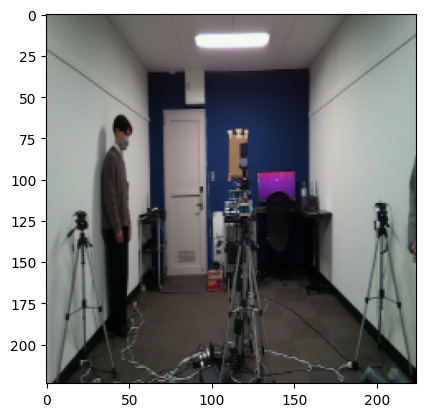

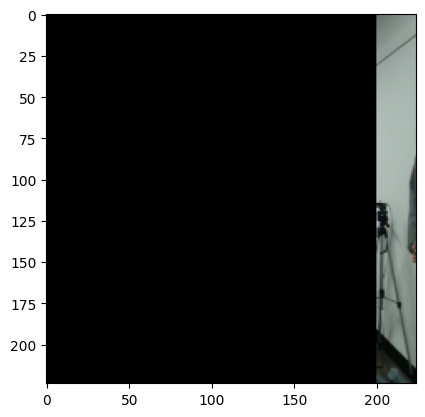

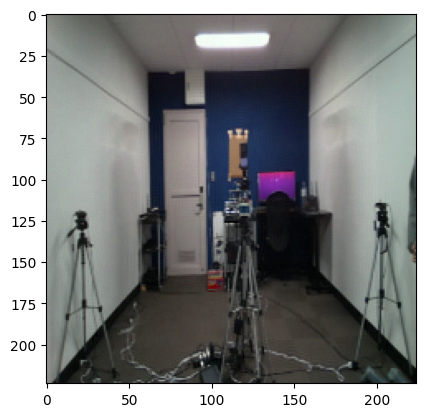

SSIM: 0.8721142
PSNR: 20.915289264117906
**************************************************************************************


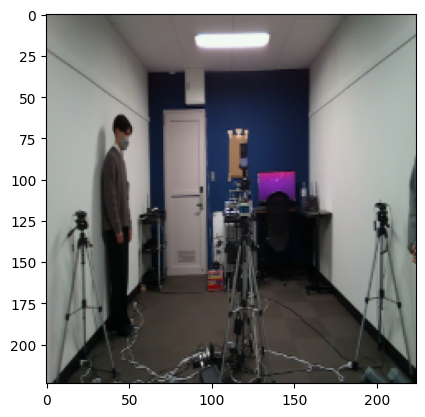

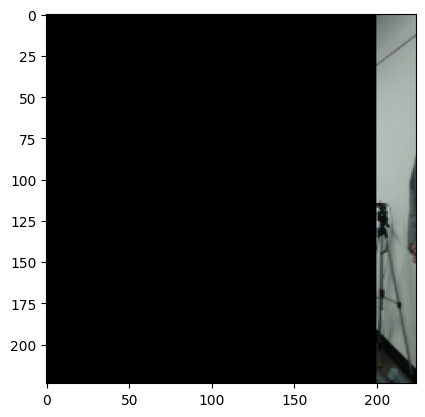

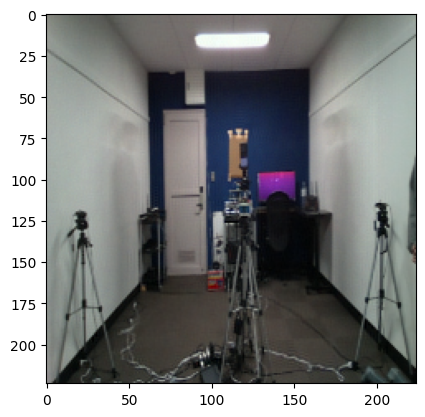

SSIM: 0.8701951
PSNR: 20.872811540710977
**************************************************************************************


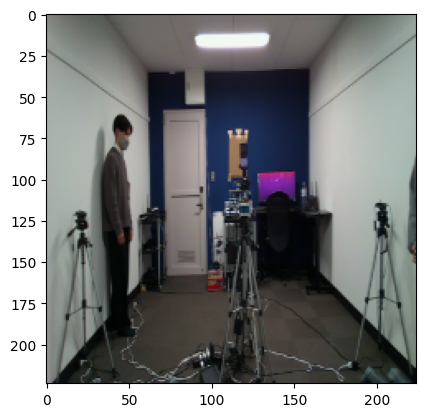

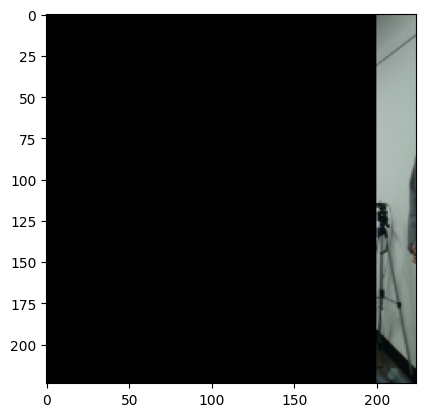

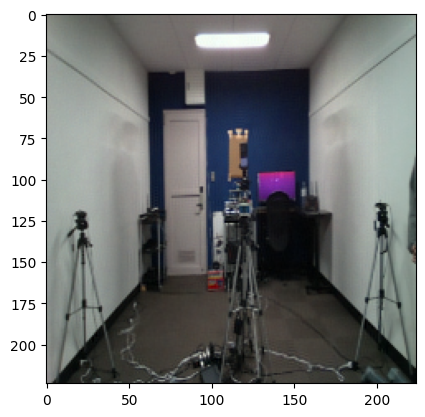

SSIM: 0.87031573
PSNR: 20.89007229170821
**************************************************************************************


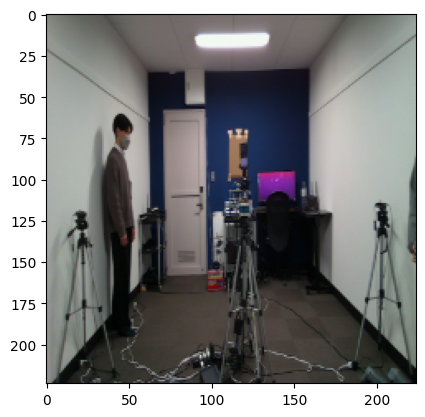

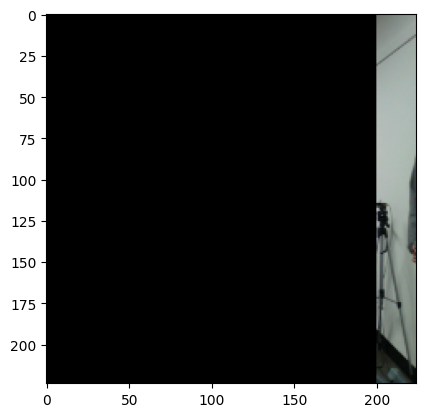

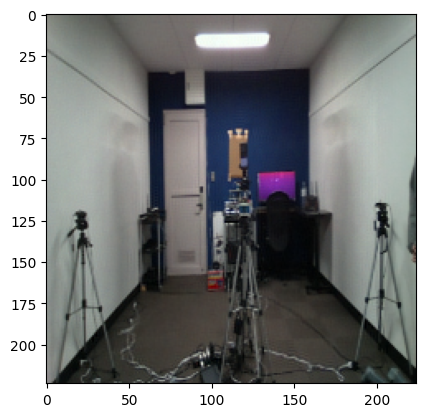

SSIM: 0.8678836
PSNR: 20.979575500698303
**************************************************************************************


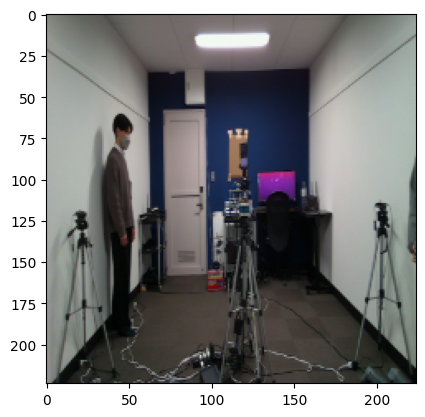

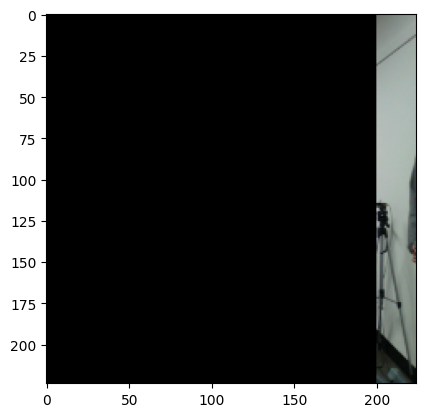

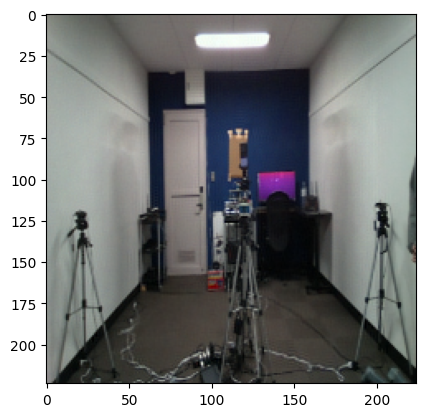

SSIM: 0.8678836
PSNR: 20.979575500698303
**************************************************************************************


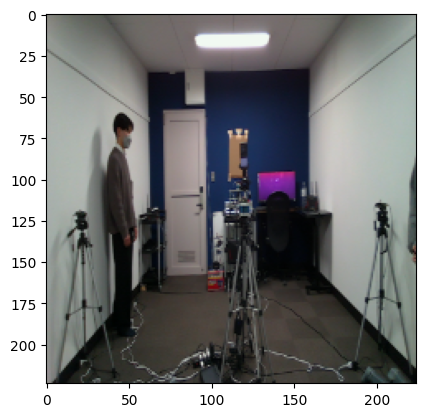

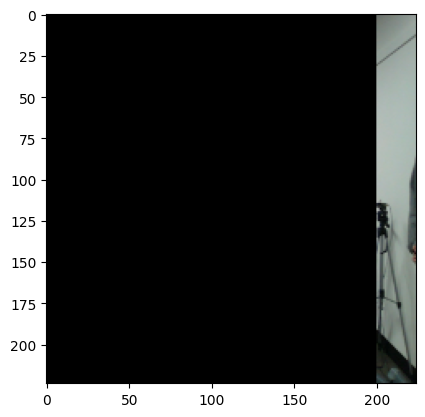

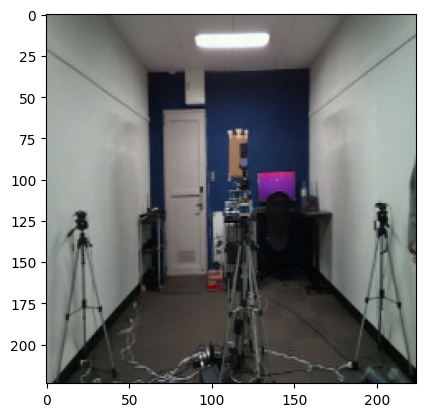

SSIM: 0.86614186
PSNR: 21.080523783141516
**************************************************************************************


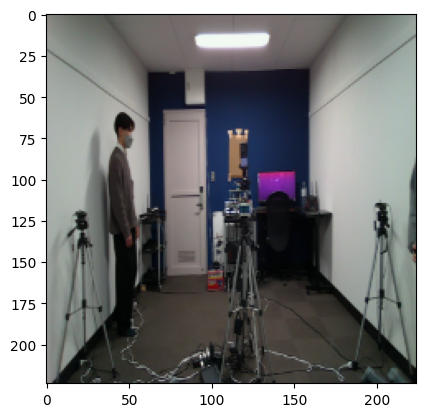

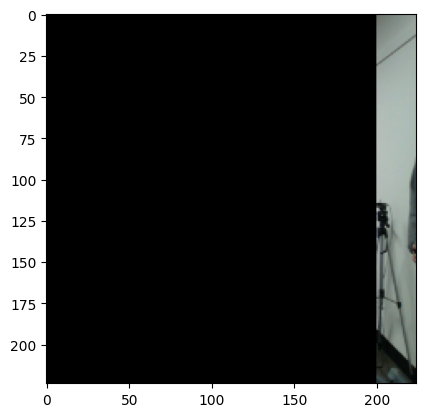

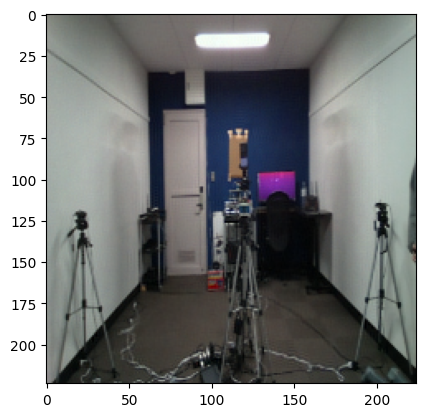

SSIM: 0.8634406
PSNR: 21.135128914609872
**************************************************************************************


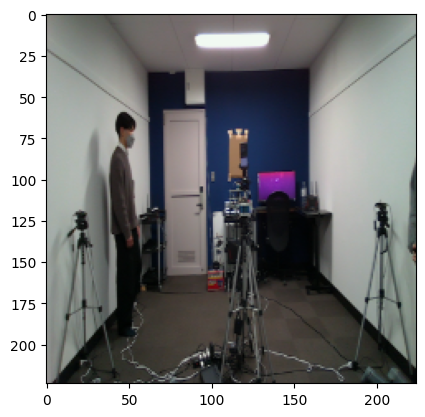

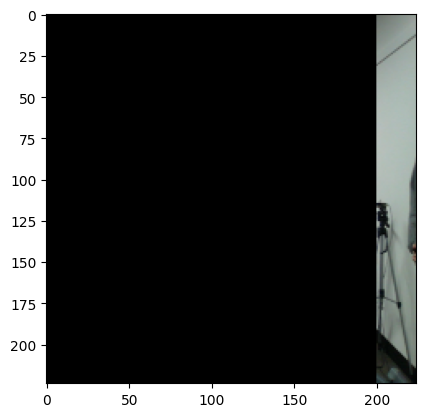

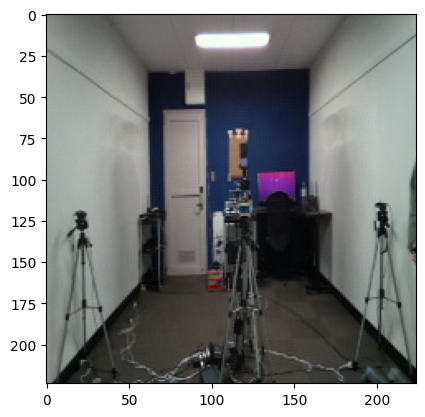

SSIM: 0.859886
PSNR: 21.24496770162861
**************************************************************************************


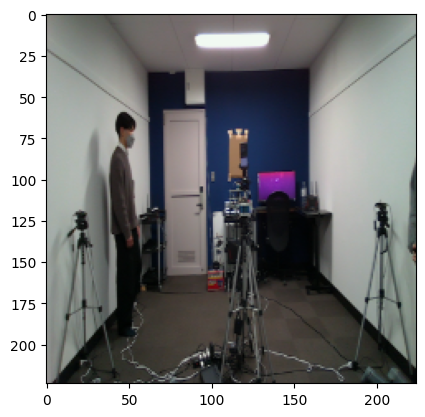

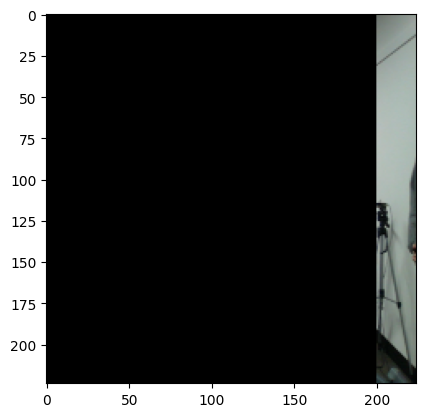

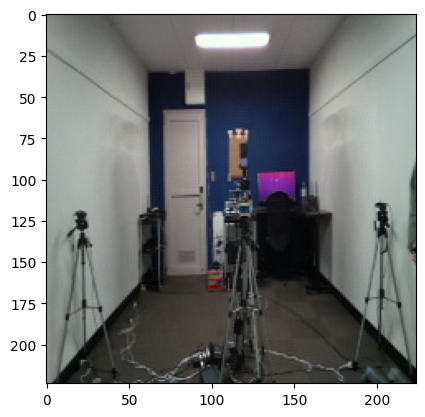

SSIM: 0.859886
PSNR: 21.24496770162861
**************************************************************************************


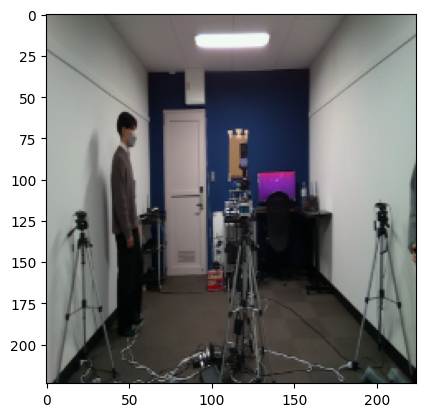

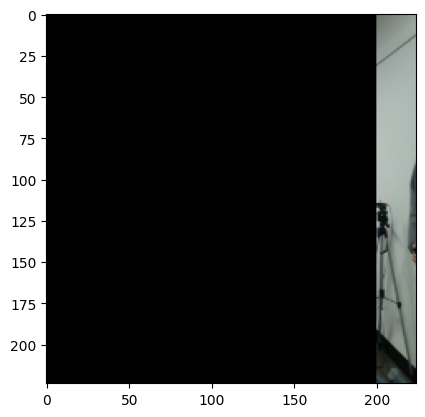

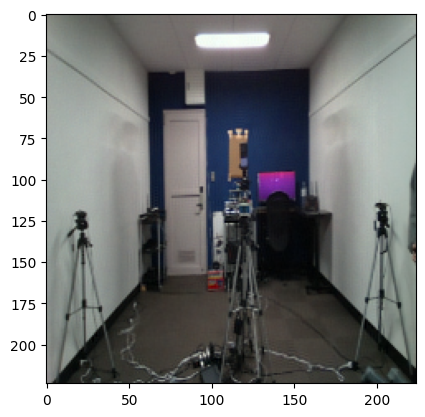

SSIM: 0.85626155
PSNR: 21.311604664426284
**************************************************************************************


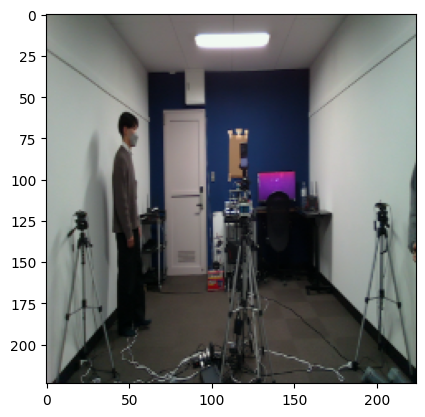

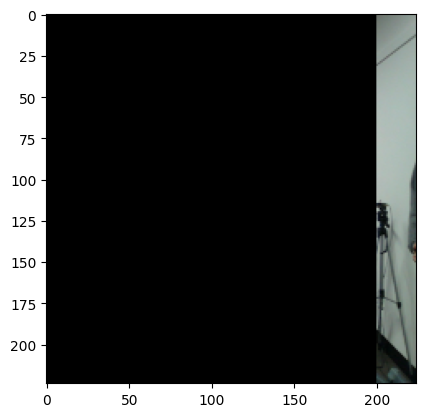

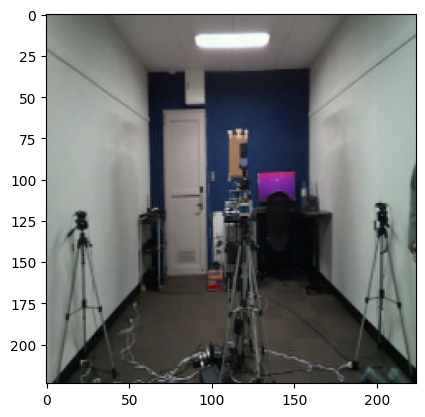

SSIM: 0.8551299
PSNR: 21.419137142010385
**************************************************************************************


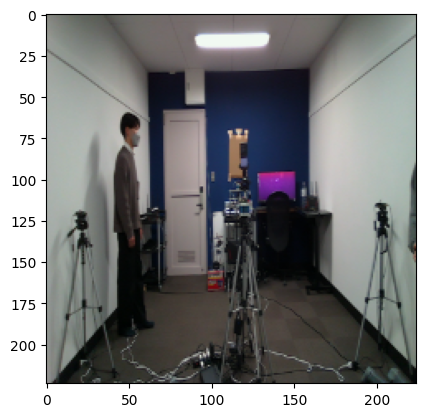

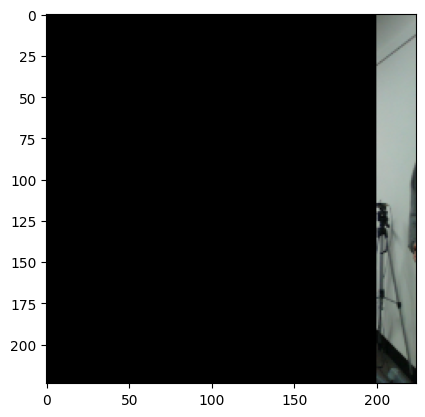

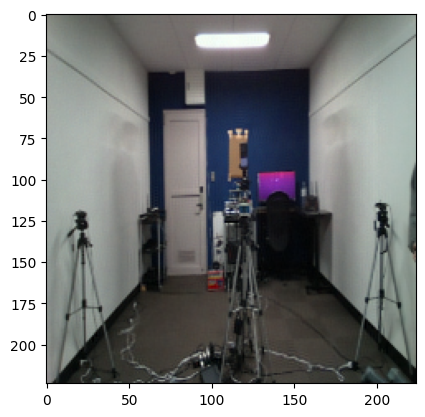

SSIM: 0.85477954
PSNR: 21.497478171171963
**************************************************************************************


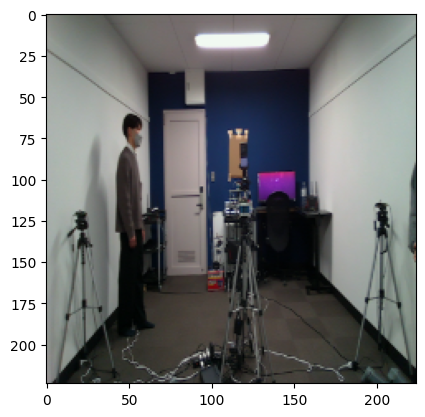

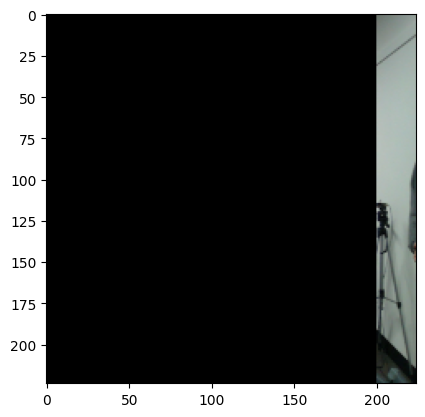

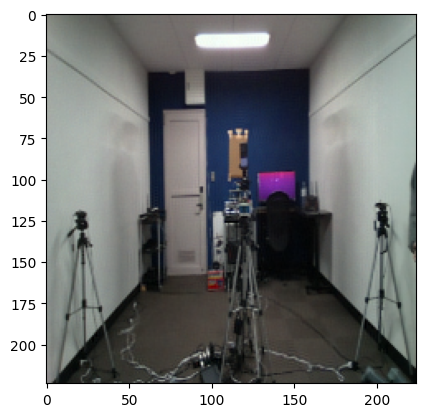

SSIM: 0.85123867
PSNR: 21.64504931669025
**************************************************************************************


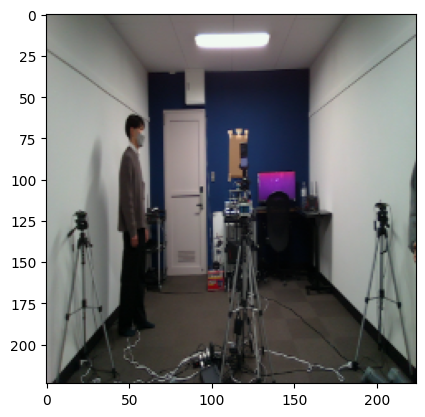

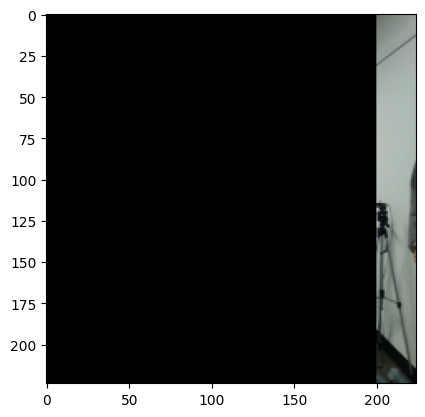

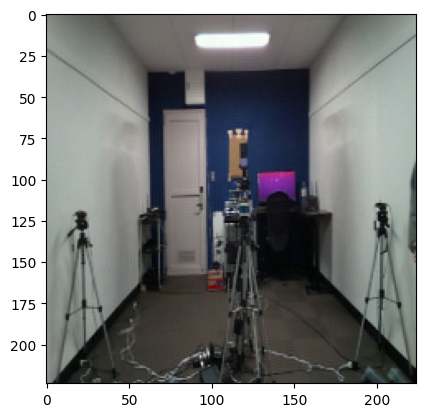

SSIM: 0.8477414
PSNR: 21.829993520441242
**************************************************************************************


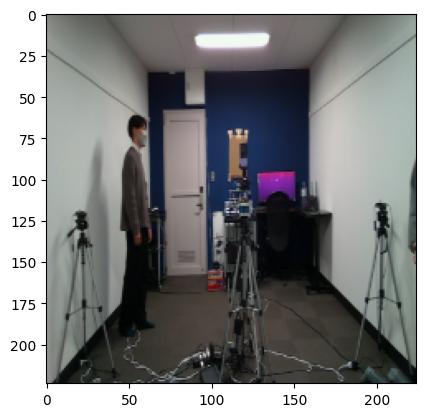

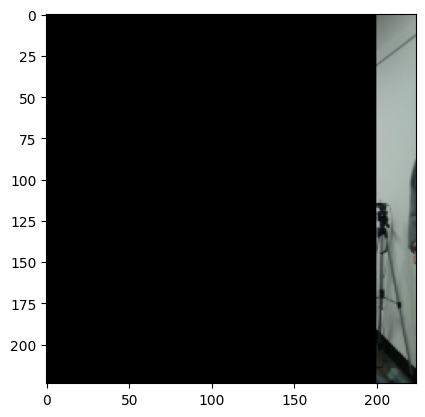

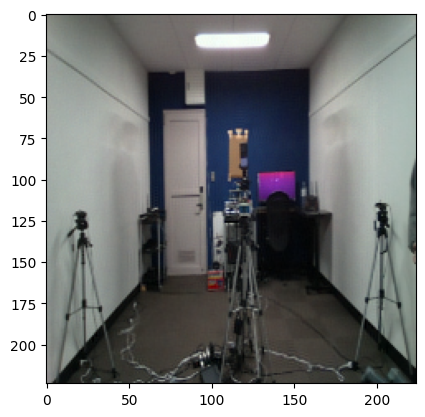

SSIM: 0.8453045
PSNR: 22.04739554725064
**************************************************************************************


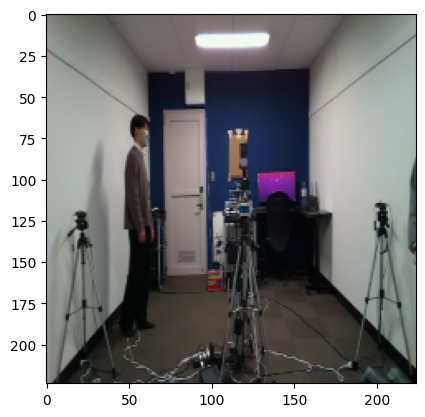

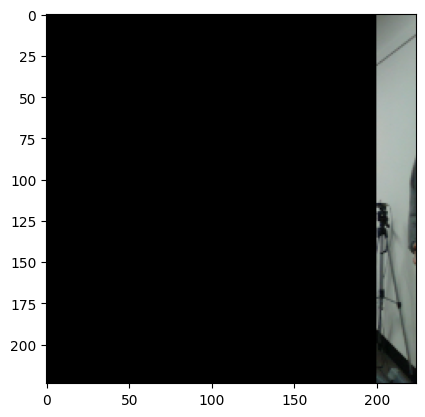

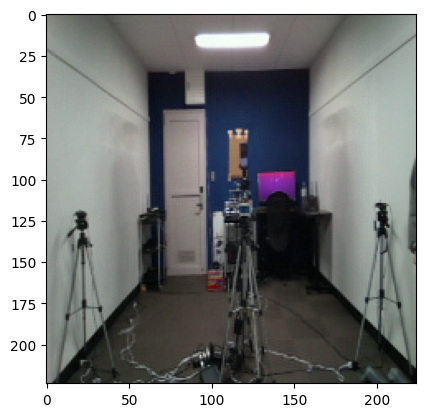

SSIM: 0.84367543
PSNR: 22.28250873573414
**************************************************************************************


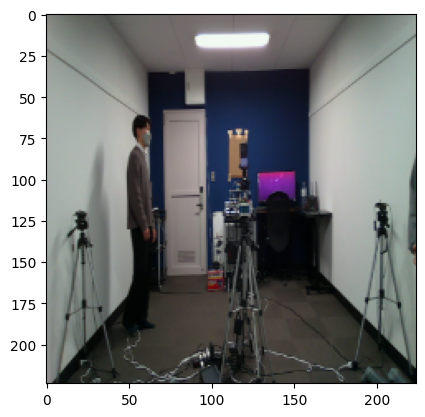

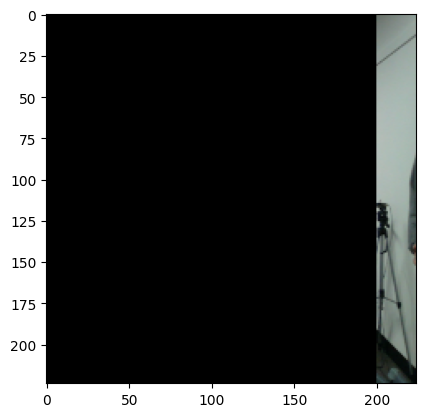

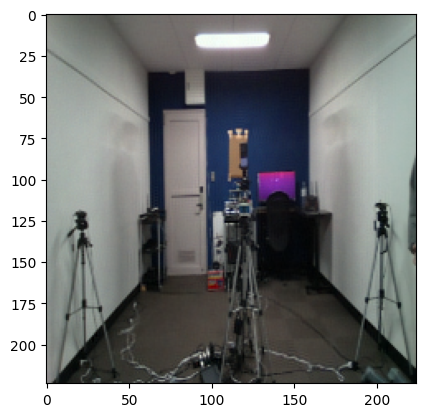

SSIM: 0.8460162
PSNR: 22.686240240197154
**************************************************************************************


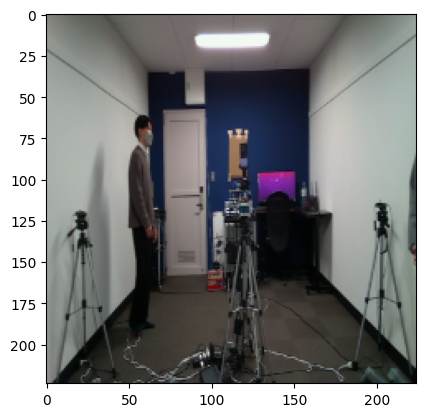

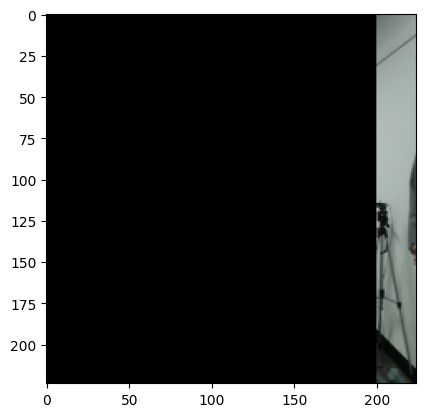

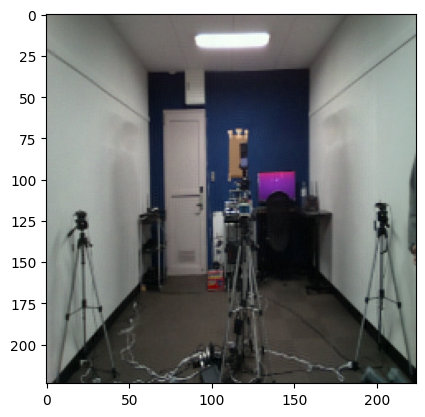

SSIM: 0.84848267
PSNR: 22.967345433335428
**************************************************************************************


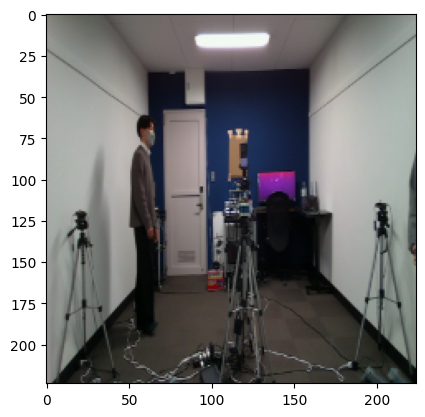

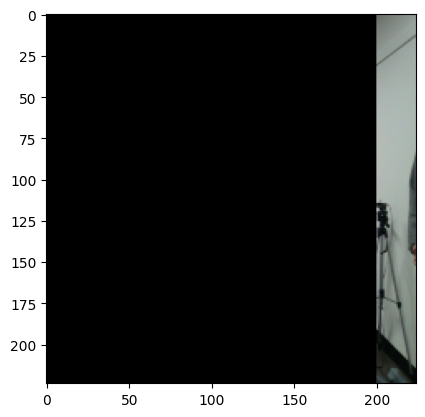

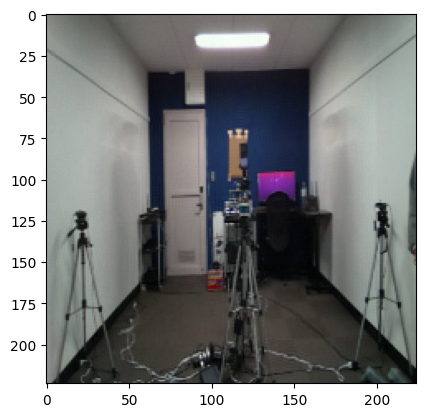

SSIM: 0.8493689
PSNR: 23.218184303030924
**************************************************************************************


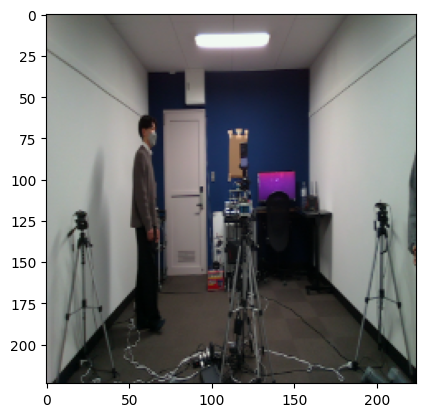

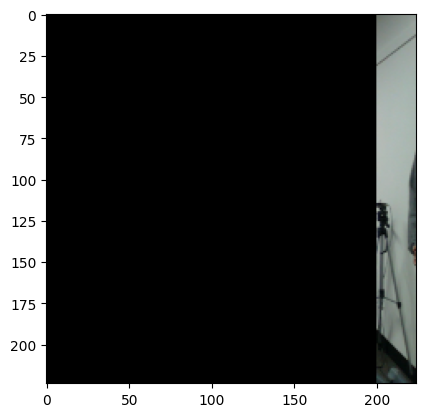

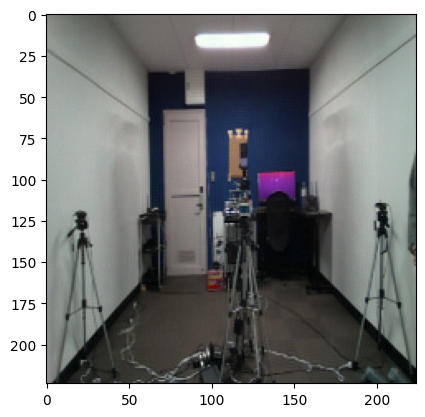

SSIM: 0.8496286
PSNR: 23.45734575789891
**************************************************************************************


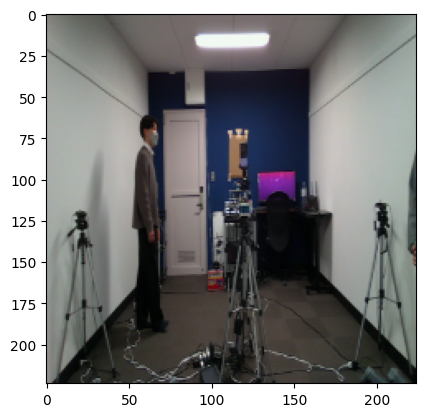

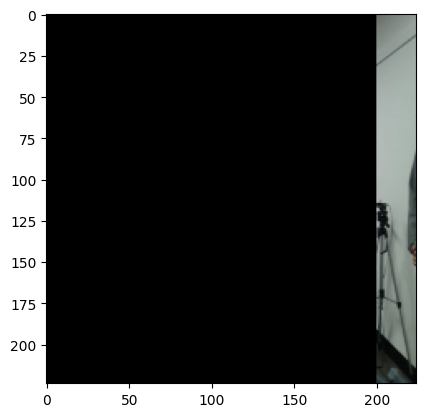

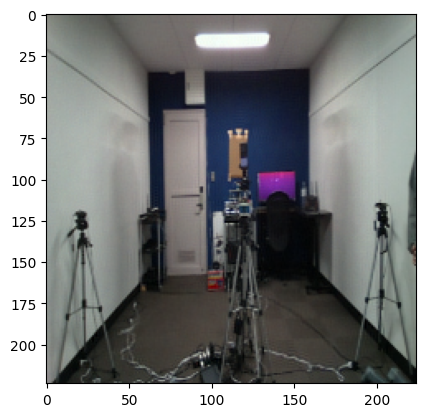

SSIM: 0.85021573
PSNR: 23.75315337482484
**************************************************************************************


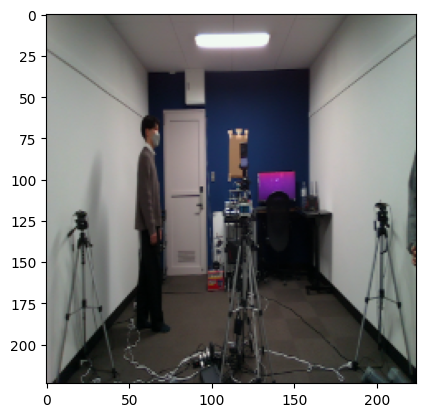

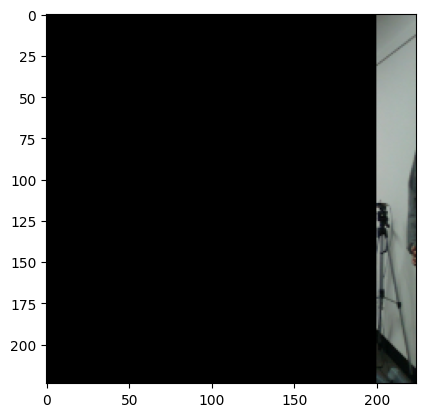

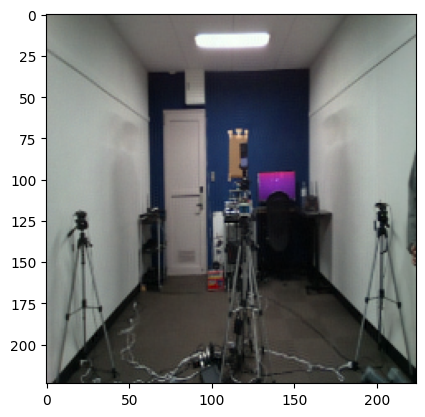

SSIM: 0.84933233
PSNR: 24.064732924775697
**************************************************************************************


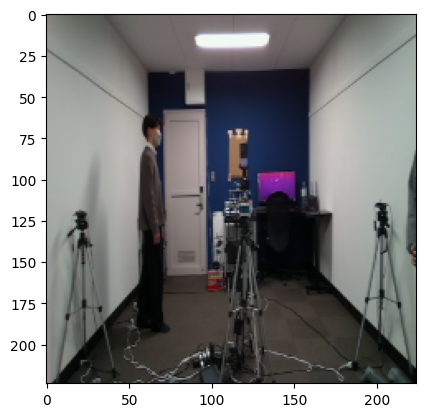

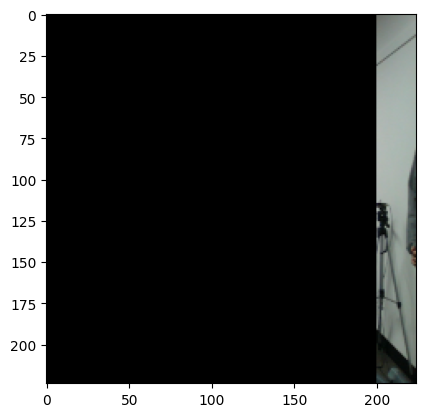

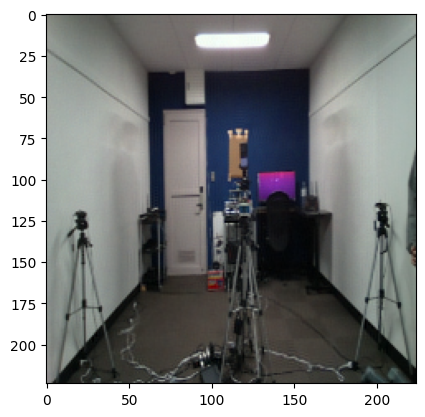

SSIM: 0.85240906
PSNR: 24.43199346357506
**************************************************************************************


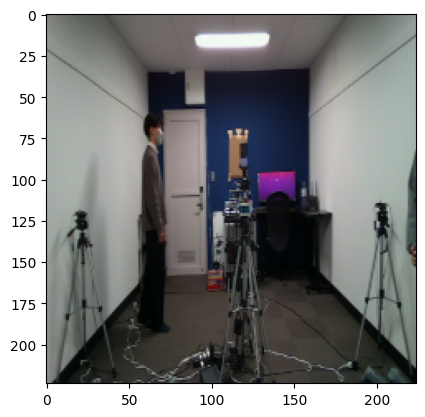

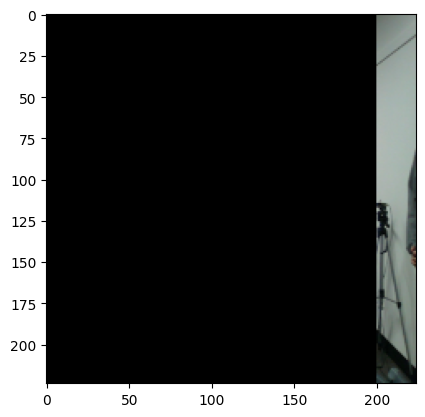

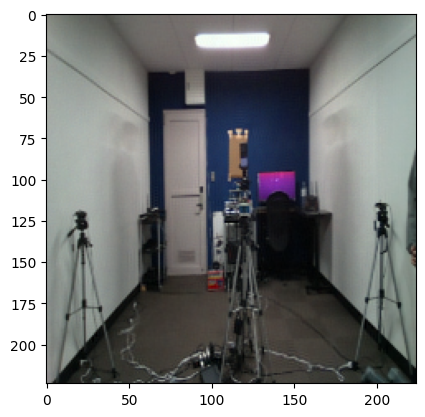

SSIM: 0.8552532
PSNR: 24.840795149170766
**************************************************************************************


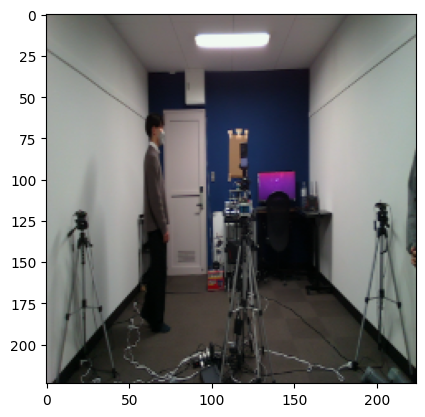

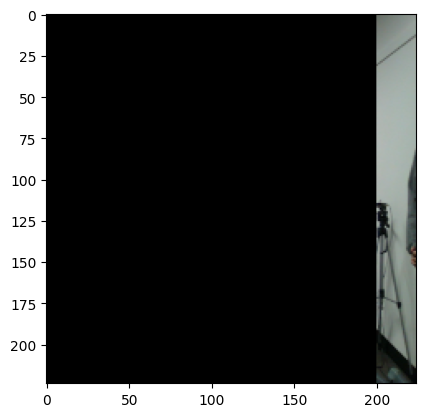

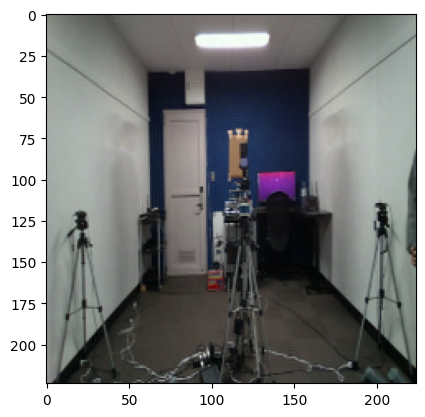

SSIM: 0.85834795
PSNR: 25.235914855003152
**************************************************************************************


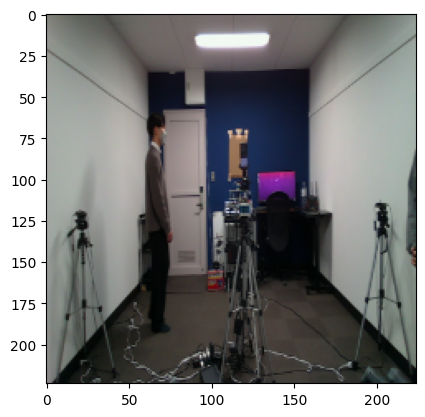

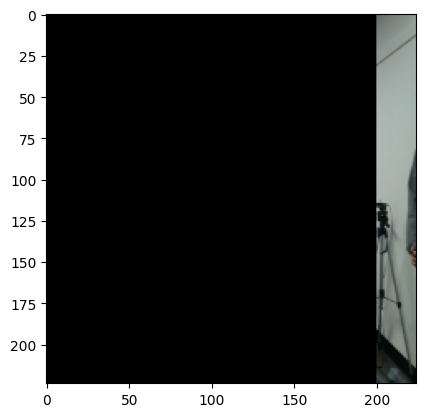

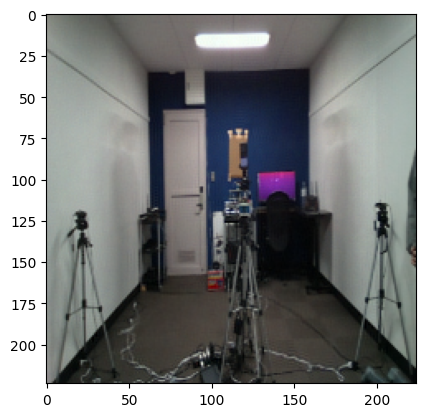

SSIM: 0.86063653
PSNR: 25.52610529244708
**************************************************************************************


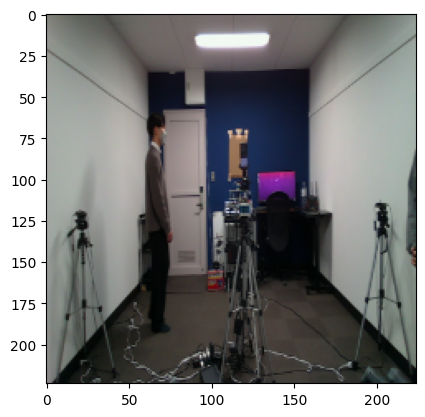

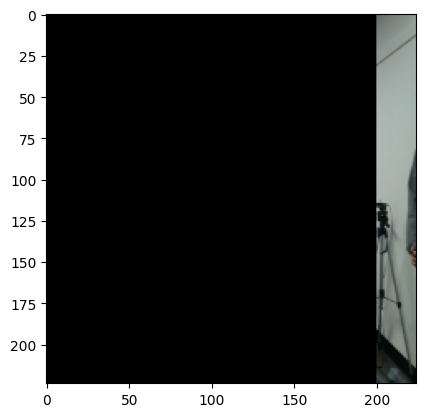

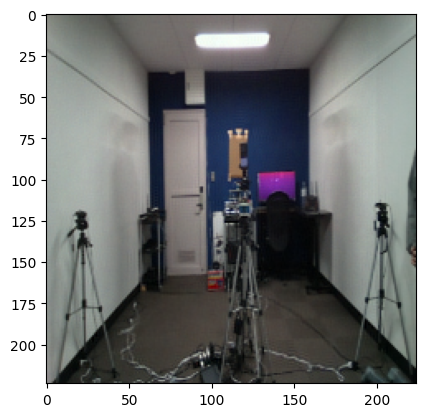

SSIM: 0.86063653
PSNR: 25.52610529244708
**************************************************************************************


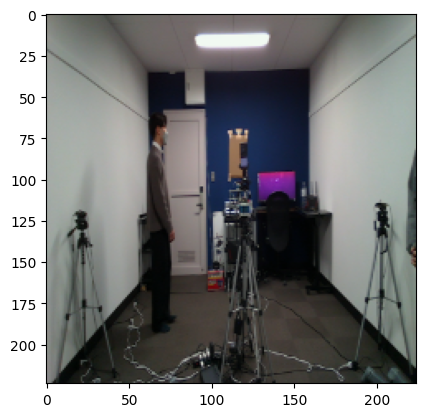

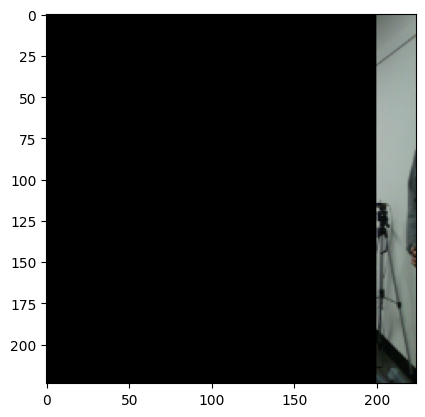

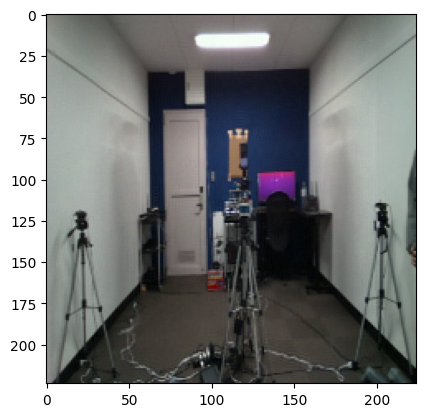

SSIM: 0.8598152
PSNR: 25.57458395661541
**************************************************************************************


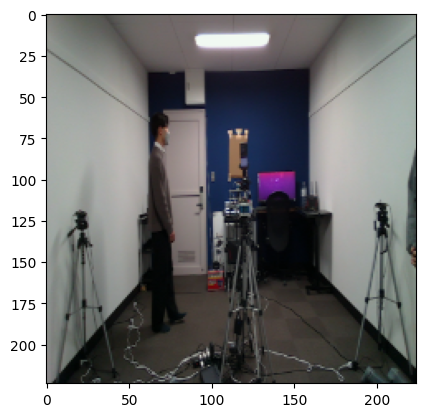

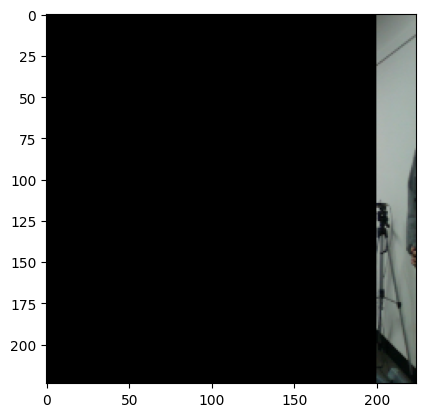

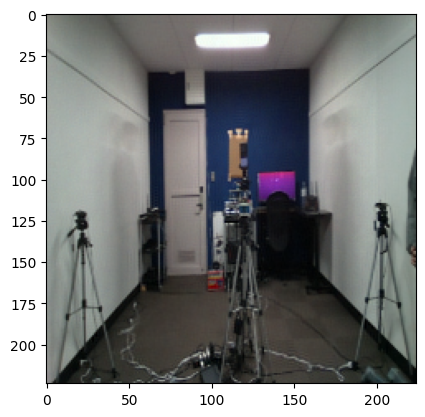

SSIM: 0.8581505
PSNR: 25.53283331699334
**************************************************************************************


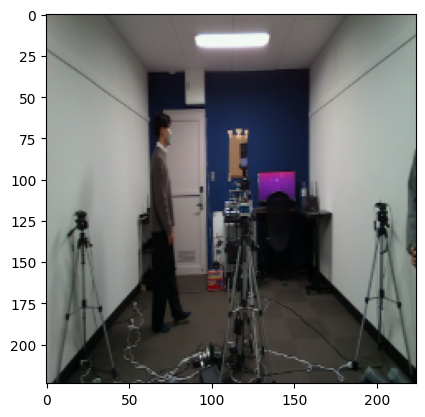

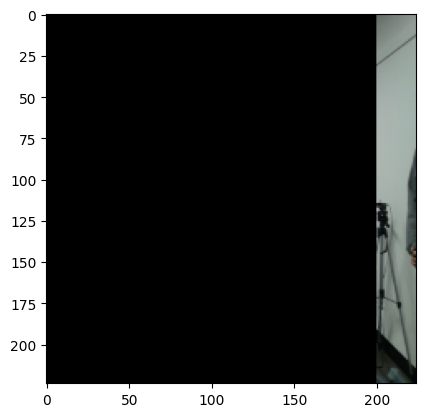

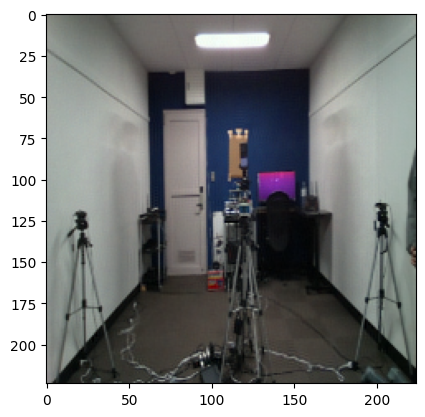

SSIM: 0.85649014
PSNR: 25.42890247321091
**************************************************************************************


In [19]:
for i in range(820, 850):

    plt.imshow(test_gd_img[i])
    plt.show()
    
    plt.imshow(test_blocked_img[i])
    plt.show()

    plt.imshow(recovered_img[i])
    plt.show()
    
    print("SSIM:", ssim(test_gd_img[i], recovered_img[i], multichannel=True, win_size=11, channel_axis=2, data_range=1))
    print("PSNR:", skimage.metrics.peak_signal_noise_ratio(test_gd_img[i], recovered_img[i], data_range=1.0))
    
    print("**************************************************************************************")